**Task3: Geospatial Analysis**

Task lists:

1. Visualize the locations of restaurants on a map using latitude and longitude information.

2. Analyze the distribution of restaurants across different cities or countries.

3. Determine if there is any correlation between the restaurant's location and its rating.

In [30]:
# Importing necessary libraries
import pandas as pd
import folium
from ipywidgets import interact
from IPython.display import display
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [2]:
# importing dataset
new_data = pd.read_csv('new_data.csv')

In [3]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

**1. Visualizing the locations of restaurants on a map using latitude and longitude information.**

The folium library is used for this purpose.  A minimal test map plotting can be adopted to ensure folium is working properly.

To create a map using Folium, the following steps are adopted
- map object is created using the folium.map class from the Folium library, this object carries two arguments (location[lat,lon], and zoom_start = a num_value). The location can be a chosen based location specified or the mean of the location from the entire dataset

- a marker using folium.marker is created and added to the map object.  Also, the popup argument which displays the restaurant's name on the location established by the map object when clicked is added.

- the result is saved or displayed

In [7]:
# Start with a minimal example to ensure Folium is working properly by creating a simple map

# Create a simple map centered at a specific point
m = folium.Map(location=[37.7749, -122.4194], zoom_start=12)

# Add a single marker
folium.Marker(
    location=[37.7749, -122.4194],
    popup='Test Marker'
).add_to(m)

# Display the map
display(m)


Folium is working, now to the main map plotting

In [6]:
# Create a base map
m = folium.Map(location=[14.565443, 121.027535], zoom_start=13)

# Add restaurant locations to the map
for _, row in new_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name']
    ).add_to(m)

# Save the map to an HTML file
m.save('restaurants_map.html')

display(m) # display the map

In [38]:
'''
Code explanation

#Specifying a location
m = folium.Map(location=[37.7749, -122.4194], zoom_start=12)

#Add a single marker
folium.Marker(
    location=[37.7749, -122.4194],
    popup='Test Marker'
).add_to(m)

#Display the map
display(m)


# Another method (applied if unsure of a base location to specify) and this time for multiple locations leading to making iterations

# Create a map centered around the mean location of all points
center_lat = df['Latitude'].mean()
center_lon = df['Longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Add markers for each restaurant
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Name']
    ).add_to(m)

# Display the map
display(m)


1. the folium.map class from Folium library is used to create a map object.  this object contains the location and the zooming preference.  The location can be a single location used as the base location or the mean of all the locations in the dataset where the map will be centered.

2. location=[center_lat, center_lon] or location=[[37.7749, -122.4194] 

- Purpose: It specifies the geopgraphical coordinates (latitude and longitude) at which the map will be initially centered.

- center_lat/37.7749: The latitude where the map will be centered.
- center_lon/-122.4194: The longitude where the map will be centered.

The map view is initially centered on these coordinates, ensuring that the data points being plotted are within view if they are around this central point.

3. zoom_start=12:

- Purpose: Sets the initial zoom level of the map.
- Zoom Levels:
  - Lower values (e.g., 1-5) show larger areas (more zoomed out).
  - Higher values (e.g., 15-20) show smaller areas (more zoomed in).
Typical Use: zoom_start=12 used here is a moderate zoom level that typically provides a good balance between showing a broad area and maintaining detail for smaller features.

- the next thing done is to add a marker which displays the restaurant's name when clicked popup='Test Marker'.  For the dataframe with 1825 locations for different restaurants, the rows are iterated to capture each location and mark the restaurant located in that location

- the result is saved or displayed
'''

"\nCode explanation\n\n#Specifying a location\nm = folium.Map(location=[37.7749, -122.4194], zoom_start=12)\n\n#Add a single marker\nfolium.Marker(\n    location=[37.7749, -122.4194],\n    popup='Test Marker'\n).add_to(m)\n\n#Display the map\ndisplay(m)\n\n\n# Another method (applied if unsure of a base location to specify) and this time for multiple locations leading to making iterations\n\n# Create a map centered around the mean location of all points\ncenter_lat = df['Latitude'].mean()\ncenter_lon = df['Longitude'].mean()\nm = folium.Map(location=[center_lat, center_lon], zoom_start=12)\n\n# Add markers for each restaurant\nfor _, row in df.iterrows():\n    folium.Marker(\n        location=[row['Latitude'], row['Longitude']],\n        popup=row['Name']\n    ).add_to(m)\n\n# Display the map\ndisplay(m)\n\n\n1. the folium.map class from Folium library is used to create a map object.  this object contains the location and the zooming preference.  The location can be a single location u

**Distribution of restaurants across cities**

In [23]:
restaurant_counts_by_cities = new_data.groupby('City')['Restaurant Name'].value_counts()

aggregated_restaurant_counts_by_cities = restaurant_counts_by_cities.groupby(level=0).sum()

aggregated_restaurant_counts_by_cities = aggregated_restaurant_counts_by_cities.sort_values(ascending=False)
aggregated_restaurant_counts_by_cities.reset_index()

,City,count
0,New Delhi,5473
1,Gurgaon,1118
2,Noida,1080
3,Faridabad,251
4,Ghaziabad,25
...,...,...
136,Dicky Beach,1
137,Lorn,1
138,Quezon City,1
139,Lincoln,1


There are 141 observations.  For clearer study on the number of restaurants by cities, I will pick the first 20 cities and the last 20 cities based on the number of restaurants.

- first set: 0 - 20

- second set: 122 - 142

In [27]:
first_20 = aggregated_restaurant_counts_by_cities[0:20]
first_20 = first_20.reset_index()

last_20 = aggregated_restaurant_counts_by_cities[122:142]
last_20 = last_20.reset_index()

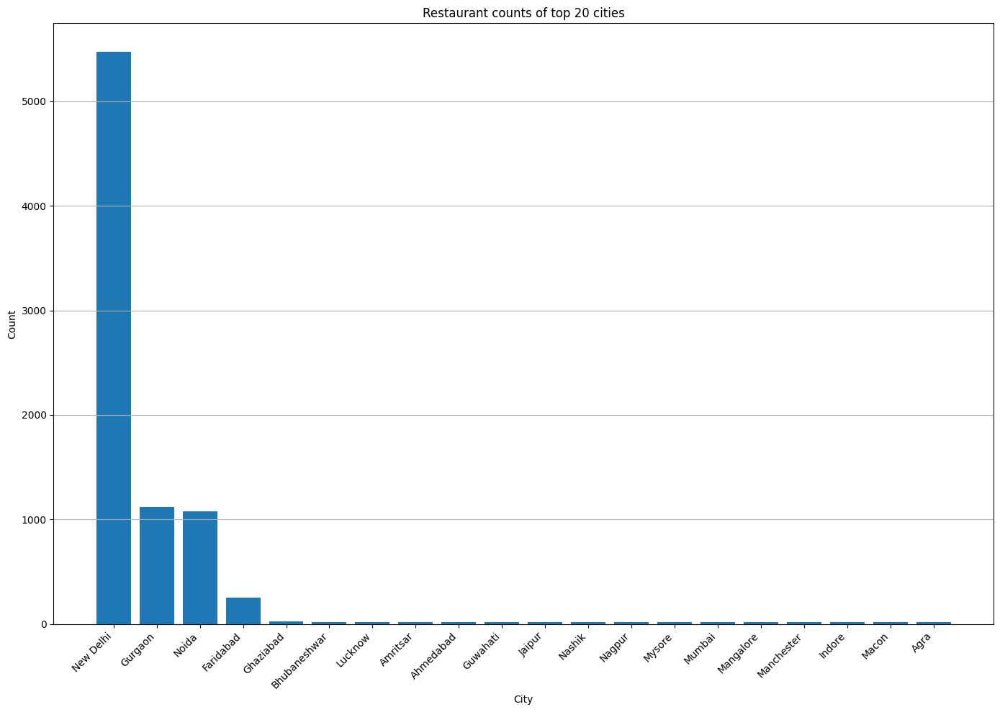

In [26]:
# Bar distribution plot for number of restaurants across cities [top 20 cities]
plt.figure(figsize=(14, 10))  # Increase figure size
plt.bar(first_20['City'], first_20['count'])  

# Customize plot
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Restaurant counts of top 20 cities')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.grid(axis='y')  # Optional: add a grid for better readability

# Show plot
plt.tight_layout()  # Adjust layout to fit labels
plt.show()

The above shows that New Delhi, Gurgaon, Noida, and Faridabad have the highest concentration of restaurants operating compared to other cities whith New Delhi having an appreciable highest concentration of restuarants among the the top four.

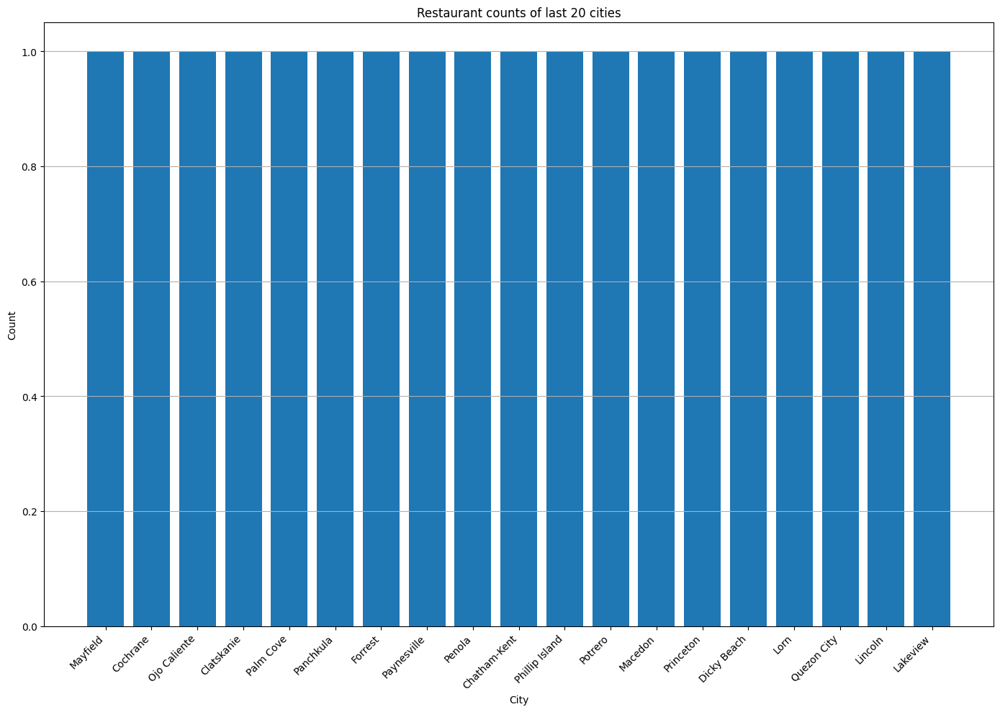

In [28]:
# Bar distribution plot for number of restaurants across cities [last 20 cities]
plt.figure(figsize=(14, 10))  # Increase figure size
plt.bar(last_20['City'], last_20['count'])  

# Customize plot
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Restaurant counts of last 20 cities')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.grid(axis='y')  # Optional: add a grid for better readability

# Show plot
plt.tight_layout()  # Adjust layout to fit labels
plt.show()

The above shows that the following are the cities with the least amount of restaurant in operation:

- Mayfield

- Cochrane

- Ojo Caliente

- Clatskanie

- Palm Cove

- Panchkula

- Forrest

- Paynesville

- Penola

- Chatham-Kent

- Phillip Island

- Potrero

- Macedon

- Princeton

- Dicky Beach

- Lorn

- Quezon City

- Lincoln

- Lakeview

**Checking if there is any correlation between the restaurant's location and its rating.**

In [37]:
# correlation between Locality and Aggregate rating; Locality is a string and needs to be encoded

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the string column to numeric
new_data['Locality_encoded'] = label_encoder.fit_transform(new_data['Locality'])

correlation = new_data['Aggregate rating'].corr(new_data['Locality_encoded'])
print(f"correlation between Locality and Aggregate rating: {correlation}")

correlation between Locality and Aggregate rating: -0.1743891808884651


The value -0.174 suggests a weak negative linear relationship between Locality and Aggregate rating.  However, this doesn't provide a full picture of how well businesses are performing in different locations.  Hence, I couldn't judge the performance of businesses on the location based on the aggregate rating of customers since more nuanced approach could be involved alongside other underlying factors.